##### Necessary imports

In [67]:
# Library imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from matplotlib.dates import DateFormatter, MonthLocator
import matplotlib.dates as mdates
import os

In [68]:
#  modules import
from large_scale_prediction import large_scale_reader
from prediction import naive_predict_over_horizon
from data import sMAPE

#### Necessary functions

In [69]:
def read_price(zone):
    df = pd.read_csv('data' + '/' + zone + '.csv')
    df.rename(columns={'Unnamed: 0': 'Date'}, inplace=True)
    index = pd.to_datetime(df['Date'])
    df.set_index(index, inplace=True)
    df.drop(columns=['Date'], inplace=True)
    df.rename(columns={'Price_DA': 'Price'}, inplace=True)
    return pd.DataFrame(df['Price'])

In [70]:
def sMAPE_plotter(zones):
    resample_rule = 'MS'

    directory = "Figures"
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Create the figure with specified DPI
    plt.figure(figsize=(15,5), dpi=300)

    # Set the font family for the entire plot
    plt.rcParams['font.family'] = 'Times New Roman'

    # Initial placeholders for min and max dates
    min_date = None
    max_date = None

    for zone in zones:
        data = Metrics[zone]['sMAPE'].resample(resample_rule).mean()
        
        # Updating the min and max dates
        current_min_date = data.index.min()
        current_max_date = data.index.max()
        
        if min_date is None or current_min_date < min_date:
            min_date = current_min_date
        if max_date is None or current_max_date > max_date:
            max_date = current_max_date
        
        plt.yticks(range(0, 151, 10))
        plt.ylim([0, 150])
        plt.plot(data, label=zone)
        plt.legend(loc='upper left')

    # Setting the x-axis limits
    plt.xlim(min_date, max_date)

    # Format the x-axis to show month names and year
    ax = plt.gca()  # Get current axis
    ax.xaxis.set_major_locator(mdates.MonthLocator())  # Set major locator for x-axis to months
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y'))  # Set major formatter for x-axis to display month abbreviations and year

    plt.xticks(rotation=90)  # Rotate x-axis labels by 45 degrees

    plt.ylabel('sMAPE %')  # Set the y-axis label

    #plt.title('sMAPE')  # Set the title
    plt.tight_layout()
    plt.savefig('Figures/'+ 'sMAPE'+ ' for' + str(zones) + '.png', dpi=500)

    plt.show()



In [71]:

def actual_vs_predicted_plotter(zone):

    resample_rule = 'D'

    directory = "Figures"
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Create the figure with specified DPI
    plt.figure(figsize=(15, 5), dpi=300)

    # Set the font family for the entire plot
    plt.rcParams['font.family'] = 'Times New Roman'

    min_date = None
    max_date = None

    plt.ylim([-50, 800])
    plt.plot(Prices[zone]['Price'].resample(resample_rule).mean(), label='Actual Prices')
    plt.plot(Prices[zone]['Preds'].resample(resample_rule).mean(), label='Predicted Prices', alpha=0.7)

    data= Prices[zone]['Price'].resample(resample_rule).mean()

    current_min_date = data.index.min()
    current_max_date = data.index.max()

    if min_date is None or current_min_date <= min_date:
        min_date = current_min_date
    if max_date is None or current_max_date >= max_date:
        max_date = current_max_date

    plt.xlim(min_date, max_date)


    # Set x-ticks for every month
    ax = plt.gca()  # Get current axis
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))  # Formatting the ticks to show month and year

    plt.xticks(rotation=90)  # Optionally rotate the x-ticks for better visibility
    plt.legend(loc='upper left')

    plt.ylabel('Price (€/MWh)')  # Set the y-axis label

    plt.tight_layout()
    plt.title(zone)
    plt.savefig('Figures/'+zone+ '_preds_vs_actual'+ '.png', dpi=500)
    plt.show()


##### The name of the zones that are about to be used

In [72]:
nordic_zones = ['FI','SE_3','NO_1', 'DK_1']
epex_zones = ['DE', 'FR', 'NL', 'BE', 'CH']
ommie_zones = ['ES', 'PT']

other_zones = ['NO_2', 'NO_3', 'NO_4', 'NO_5', 'SE_1', 'SE_2', 'SE_4', 'DK_2']

all_zones = nordic_zones + epex_zones + ommie_zones + other_zones
all_zones.sort()

#### Read all the data and metrics

In [73]:
Preds = dict()
Metrics = dict()
Prices = dict()

for zone in all_zones:
    Preds[zone], Metrics[zone] = large_scale_reader(zone)
    Prices[zone] = read_price(zone).join(Preds[zone], how='inner')

    df = pd.read_csv('data' + '/' + zone + '.csv')
    df.rename(columns={'Unnamed: 0': 'Date'}, inplace=True)
    index = pd.to_datetime(df['Date'])
    df.set_index(index, inplace=True)
    df.drop(columns=['Date'], inplace=True)
    naive_predictions, naive_MAE, naive_sMAPE = naive_predict_over_horizon(df, df.loc['2018':])
    Prices[zone]['Naive_preds'] = naive_predictions


##### Plotting and tables

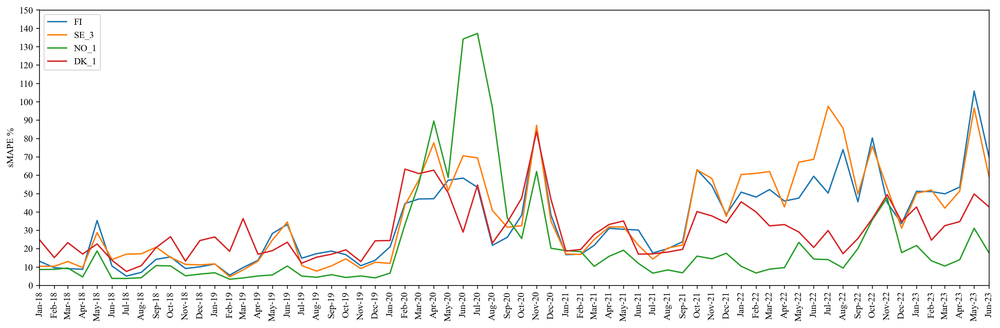

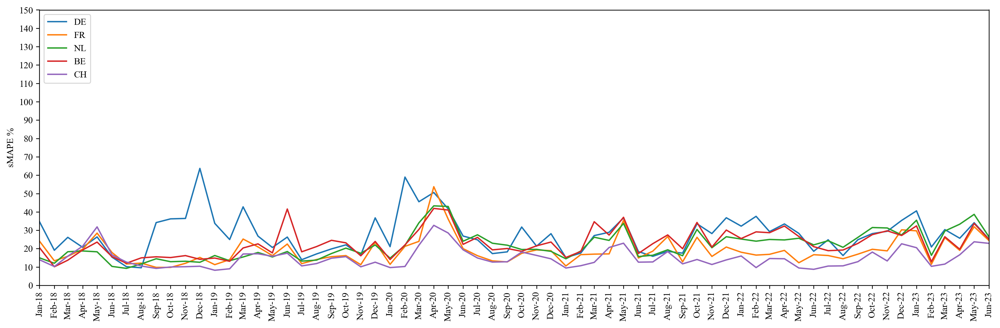

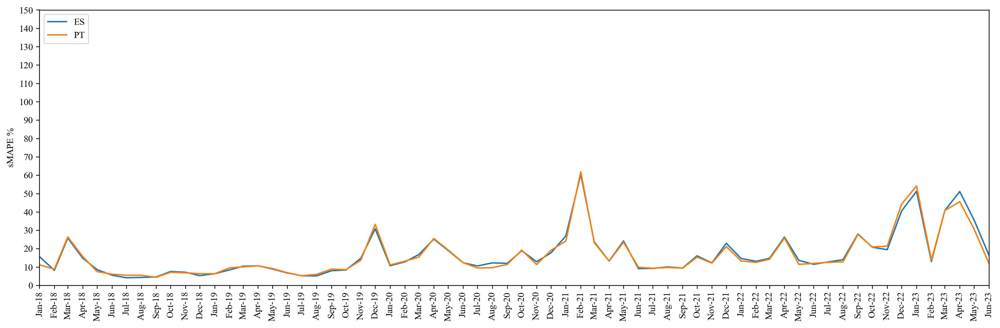

In [74]:
for zones in [nordic_zones, epex_zones, ommie_zones]:
    sMAPE_plotter(zones)

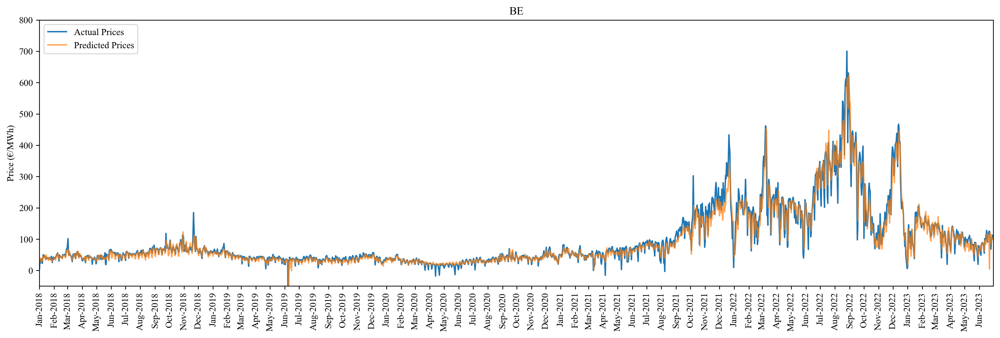

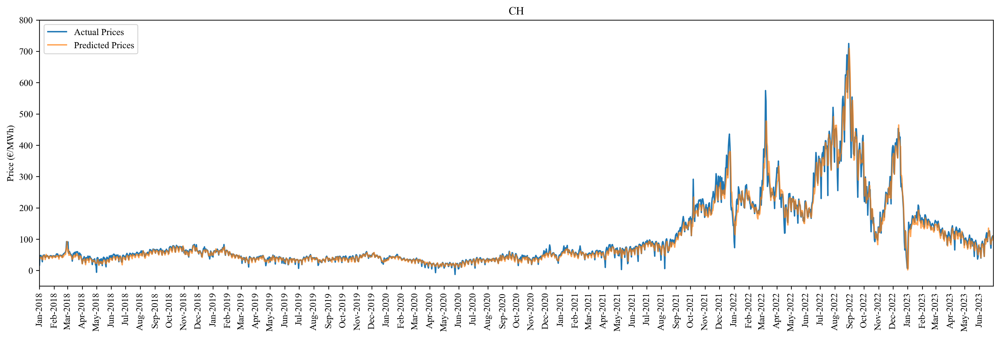

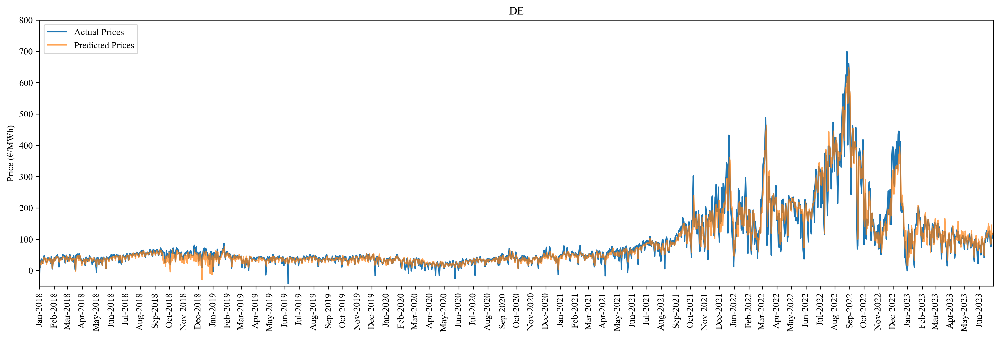

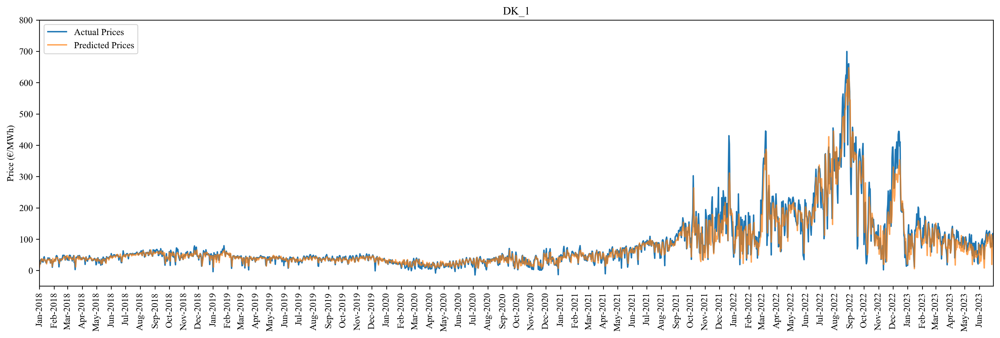

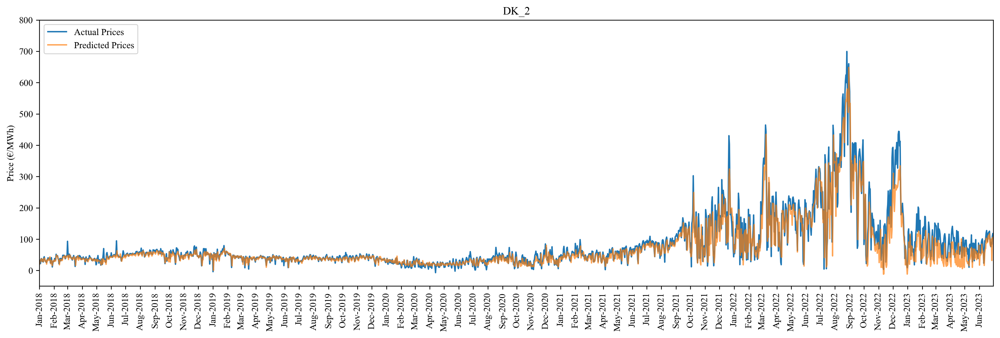

...

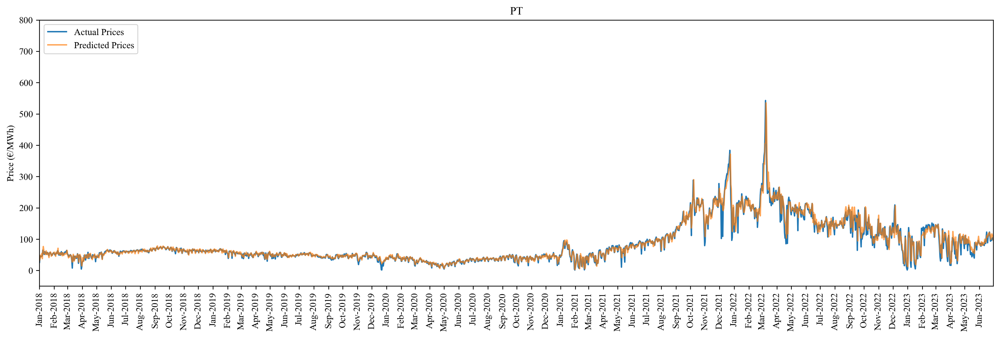

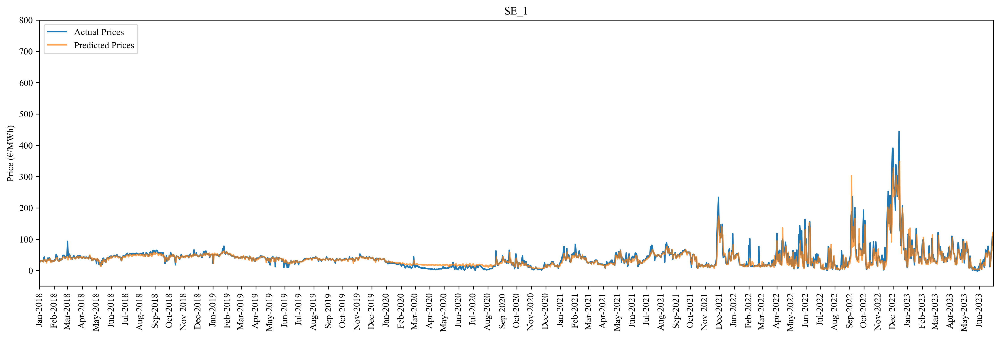

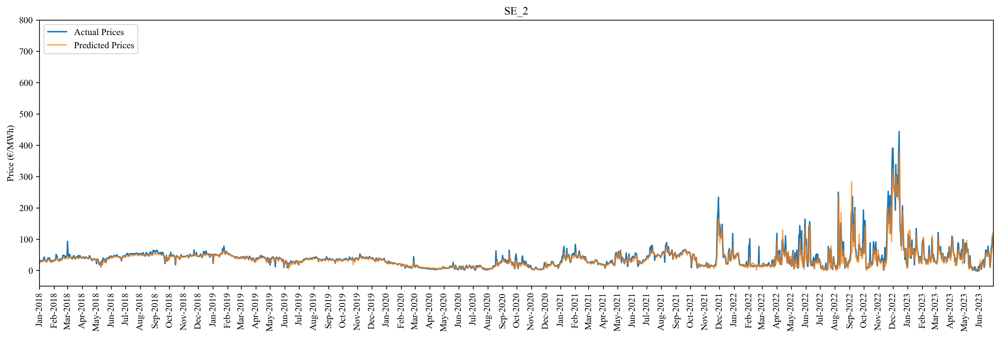

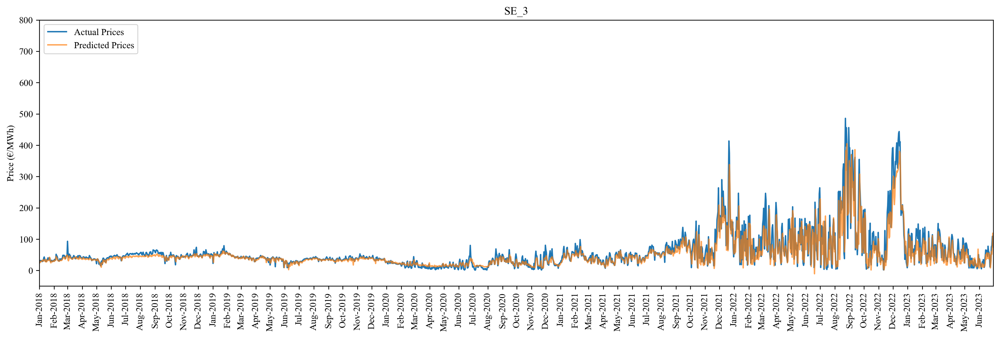

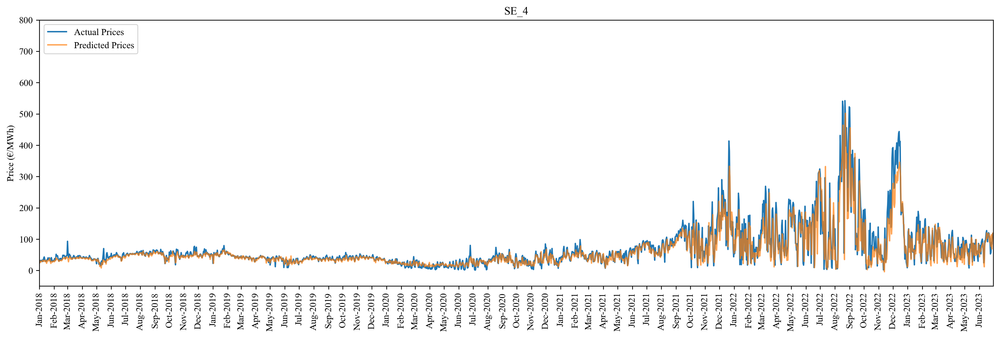

In [75]:
for zone in all_zones:
    actual_vs_predicted_plotter(zone)

In [76]:
for zone in all_zones:
    for year in ['2018', '2019', '2020', '2021', '2022', '2023']:
        r2 = r2_score(Prices[zone]['Price'].loc[year],Prices[zone]['Preds'].loc[year]) * 100
        print(f'{zone} {year} : {r2}' )

BE 2018 : 62.92277141076883
BE 2019 : 32.21775447090812
BE 2020 : 60.847571467143126
BE 2021 : 79.06883642423175
BE 2022 : 74.50067859819482
BE 2023 : 58.774348034588755
CH 2018 : 72.08040639581871
CH 2019 : 72.94986332085416
CH 2020 : 76.13834715959096
CH 2021 : 92.1999000434093
CH 2022 : 87.06817953446749
CH 2023 : 71.37739522570973
DE 2018 : 23.862067066945514
DE 2019 : 49.35684268924388
DE 2020 : 59.546003979407935
DE 2021 : 75.77809441921617
DE 2022 : 77.44823695754197
DE 2023 : 54.61757701464798
DK_1 2018 : 58.502788149894
DK_1 2019 : 49.896694390994334
DK_1 2020 : 49.39181919077185
DK_1 2021 : 66.06627556842881
DK_1 2022 : 76.6053608036242
DK_1 2023 : 42.67547571597813
DK_2 2018 : 49.6156238905913
DK_2 2019 : 49.30271339067848
DK_2 2020 : 44.089230169079094
DK_2 2021 : 63.59700790474252
DK_2 2022 : 69.90352219385767
DK_2 2023 : -6.5599538721816675
ES 2018 : 79.07658366165946
ES 2019 : 74.08001961640991
ES 2020 : 74.20677086193288
ES 2021 : 89.27624767411791
ES 2022 : 70.66305865

In [77]:
for zone in all_zones:
    for year in ['2018', '2019', '2020', '2021', '2022', '2023']:
        r2 = r2_score(Prices[zone]['Price'].loc[year],Prices[zone]['Preds'].loc[year]) * 100
        print(f'{zone} {year} R2 : {r2}' )

BE 2018 R2 : 62.92277141076883
BE 2019 R2 : 32.21775447090812
BE 2020 R2 : 60.847571467143126
BE 2021 R2 : 79.06883642423175
BE 2022 R2 : 74.50067859819482
BE 2023 R2 : 58.774348034588755
CH 2018 R2 : 72.08040639581871
CH 2019 R2 : 72.94986332085416
CH 2020 R2 : 76.13834715959096
CH 2021 R2 : 92.1999000434093
CH 2022 R2 : 87.06817953446749
CH 2023 R2 : 71.37739522570973
DE 2018 R2 : 23.862067066945514
DE 2019 R2 : 49.35684268924388
DE 2020 R2 : 59.546003979407935
DE 2021 R2 : 75.77809441921617
DE 2022 R2 : 77.44823695754197
DE 2023 R2 : 54.61757701464798
DK_1 2018 R2 : 58.502788149894
DK_1 2019 R2 : 49.896694390994334
DK_1 2020 R2 : 49.39181919077185
DK_1 2021 R2 : 66.06627556842881
DK_1 2022 R2 : 76.6053608036242
DK_1 2023 R2 : 42.67547571597813
DK_2 2018 R2 : 49.6156238905913
DK_2 2019 R2 : 49.30271339067848
DK_2 2020 R2 : 44.089230169079094
DK_2 2021 R2 : 63.59700790474252
DK_2 2022 R2 : 69.90352219385767
DK_2 2023 R2 : -6.5599538721816675
ES 2018 R2 : 79.07658366165946
ES 2019 R2 :

In [78]:
for zone in all_zones:
    for year in ['2018', '2019', '2020', '2021', '2022', '2023']:
        rMAE = mean_absolute_error(Prices[zone]['Price'].loc[year],Prices[zone]['Preds'].loc[year]) / mean_absolute_error(Prices[zone]['Price'].loc[year],Prices[zone]['Naive_preds'].loc[year])
        print(f'{zone} {year} rMAE : {rMAE}' )

BE 2018 rMAE : 0.6497373663865402
BE 2019 rMAE : 0.8467858429999823
BE 2020 rMAE : 0.8003158157550249
BE 2021 rMAE : 0.7663572530853525
BE 2022 rMAE : 0.6106349773613032
BE 2023 rMAE : 0.6706247130346276
CH 2018 rMAE : 0.8276979849036765
CH 2019 rMAE : 0.7624702475891265
CH 2020 rMAE : 0.7986659094279575
CH 2021 rMAE : 0.6773331529733327
CH 2022 rMAE : 0.52360035294109
CH 2023 rMAE : 0.8133202358252659
DE 2018 rMAE : 0.8336456101296106
DE 2019 rMAE : 0.7275894945828297
DE 2020 rMAE : 0.6874460878673838
DE 2021 rMAE : 0.6808219795818612
DE 2022 rMAE : 0.5628161799187633
DE 2023 rMAE : 0.6513747374000146
DK_1 2018 rMAE : 0.6327134702832637
DK_1 2019 rMAE : 0.6924601121253121
DK_1 2020 rMAE : 0.686448816951357
DK_1 2021 rMAE : 0.6380540140434763
DK_1 2022 rMAE : 0.5546431182076224
DK_1 2023 rMAE : 0.699324859517692
DK_2 2018 rMAE : 0.6957430718394788
DK_2 2019 rMAE : 0.7510520337224329
DK_2 2020 rMAE : 0.7514079458374914
DK_2 2021 rMAE : 0.6552830927621198
DK_2 2022 rMAE : 0.5912911331280

In [79]:
for zone in all_zones:
    r2 = r2_score(Prices[zone]['Price'],Prices[zone]['Preds']) * 100
    print(f'{zone} R2: {r2}' )

BE R2: 88.08051296201965
CH R2: 95.49869934679676
DE R2: 88.04447808864238
DK_1 R2: 86.18136683907791
DK_2 R2: 80.38415082455363
ES R2: 89.54365312363953
FI R2: 71.24341733472906
FR R2: 91.25732874736072
NL R2: 87.69358316393969
NO_1 R2: 91.61779529057746
NO_2 R2: 91.33639292065052
NO_3 R2: 73.62006336795413
NO_4 R2: 66.63772811511657
NO_5 R2: 91.59114699543768
PT R2: 89.78195637062434
SE_1 R2: 72.85213637889325
SE_2 R2: 69.63281276604134
SE_3 R2: 70.46473925661225
SE_4 R2: 71.96515697223987


In [80]:
for zone in all_zones:
    rMAE = mean_absolute_error(Prices[zone]['Price'],Prices[zone]['Preds']) / mean_absolute_error(Prices[zone]['Price'],Prices[zone]['Naive_preds'])
    print(f'{zone} rMAE: {rMAE:.2f}')

BE rMAE: 0.67
CH rMAE: 0.62
DE rMAE: 0.63
DK_1 rMAE: 0.61
DK_2 rMAE: 0.66
ES rMAE: 0.64
FI rMAE: 0.68
FR rMAE: 0.63
NL rMAE: 0.72
NO_1 rMAE: 0.58
NO_2 rMAE: 0.65
NO_3 rMAE: 0.56
NO_4 rMAE: 0.53
NO_5 rMAE: 0.61
PT rMAE: 0.65
SE_1 rMAE: 0.56
SE_2 rMAE: 0.54
SE_3 rMAE: 0.67
SE_4 rMAE: 0.64


In [81]:
for zone in all_zones:
    MAE = mean_absolute_error(Prices[zone]['Price'],Prices[zone]['Preds']) 
    mean = Prices[zone]['Price'].mean()
    std = Prices[zone]['Price'].std()

    print(f'{zone} MAE: {MAE:.3f} for price: {mean:.3f} ~ {std:.3f}')

BE MAE: 18.863 for price: 96.352 ~ 102.544
CH MAE: 12.988 for price: 106.201 ~ 111.456
DE MAE: 19.208 for price: 90.307 ~ 102.134
DK_1 MAE: 19.461 for price: 84.312 ~ 97.744
DK_2 MAE: 23.194 for price: 83.006 ~ 96.806
ES MAE: 11.844 for price: 84.069 ~ 66.234
FI MAE: 20.855 for price: 68.243 ~ 78.444
FR MAE: 15.920 for price: 102.201 ~ 114.437
NL MAE: 18.575 for price: 95.145 ~ 99.970
NO_1 MAE: 9.966 for price: 73.623 ~ 80.486
NO_2 MAE: 11.759 for price: 77.358 ~ 89.586
NO_3 MAE: 7.105 for price: 35.978 ~ 35.331
NO_4 MAE: 4.527 for price: 30.192 ~ 25.352
NO_5 MAE: 10.281 for price: 73.403 ~ 80.191
PT MAE: 11.757 for price: 84.346 ~ 66.116
SE_1 MAE: 9.487 for price: 40.348 ~ 40.470
SE_2 MAE: 9.475 for price: 40.886 ~ 41.226
SE_3 MAE: 19.094 for price: 59.972 ~ 71.991
SE_4 MAE: 21.188 for price: 69.974 ~ 80.879


#### Define the reporting table

In [82]:
keys = ['zone', 'sMAPE (%)', 'rMAE', 'MAE',  'mean', 'STD', 'STD/mean', 'mean(+-STD)']
Table= {key: [] for key in keys}

In [83]:
for zone in all_zones:
    Table['zone'].append(zone)
    Table['sMAPE (%)'].append(sMAPE(Prices[zone]['Price'],Prices[zone]['Preds']))
    Table['rMAE'].append(mean_absolute_error(Prices[zone]['Price'],Prices[zone]['Preds']) / mean_absolute_error(Prices[zone]['Price'],Prices[zone]['Naive_preds']))
    #Table['R2'].append(r2_score(Prices[zone]['Price'],Prices[zone]['Preds']) * 100)
    Table['MAE'].append(mean_absolute_error(Prices[zone]['Price'],Prices[zone]['Preds']))
    Table['mean'].append(Prices[zone]['Price'].mean())
    Table['STD'].append(Prices[zone]['Price'].std())
    Table['STD/mean'].append(Prices[zone]['Price'].std() / Prices[zone]['Price'].mean())
    Table['mean(+-STD)'].append(f'{Prices[zone]["Price"].mean():.2f} +- {Prices[zone]["Price"].std():.2f}')

In [84]:
pd.DataFrame(Table).round(2).to_excel('overal_metrics.xlsx', index=False)

In [85]:
pd.DataFrame(Table)

,zone,sMAPE (%),rMAE,MAE,mean,STD,STD/mean,mean(+-STD)
0,BE,23.000233,0.673116,18.862838,96.352348,102.544440,1.064265,96.35 +- 102.54
1,CH,14.946996,0.624387,12.987672,106.200826,111.456297,1.049486,106.20 +- 111.46
2,DE,27.765419,0.630228,19.208278,90.306634,102.133821,1.130967,90.31 +- 102.13
3,DK_1,30.045545,0.607071,19.461030,84.312060,97.743773,1.159310,84.31 +- 97.74
4,DK_2,34.134749,0.660086,23.194401,83.006387,96.805599,1.166243,83.01 +- 96.81
5,ES,16.544271,0.644988,11.843890,84.068901,66.233705,0.787850,84.07 +- 66.23
6,FI,34.283972,0.680262,20.855260,68.243350,78.444152,1.149477,68.24 +- 78.44
7,FR,18.959866,0.629393,15.919899,102.201283,114.436675,1.119719,102.20 +- 114.44
8,NL,21.707131,0.715395,18.574767,95.144690,99.969737,1.050713,95.14 +- 99.97
9,NO_1,21.353484,0.578719,9.965664,73.623218,80.485858,1.093213,73.62 +- 80.49


In [86]:
pd.DataFrame(Table).sort_values(by='rMAE')

,zone,sMAPE (%),rMAE,MAE,mean,STD,STD/mean,mean(+-STD)
12,NO_4,18.605468,0.534031,4.527036,30.192092,25.351798,0.839683,30.19 +- 25.35
16,SE_2,27.077345,0.538146,9.474915,40.885602,41.225730,1.008319,40.89 +- 41.23
11,NO_3,28.050383,0.555071,7.105352,35.977827,35.330866,0.982018,35.98 +- 35.33
15,SE_1,29.690459,0.559979,9.486578,40.348135,40.470413,1.003031,40.35 +- 40.47
9,NO_1,21.353484,0.578719,9.965664,73.623218,80.485858,1.093213,73.62 +- 80.49
3,DK_1,30.045545,0.607071,19.461030,84.312060,97.743773,1.159310,84.31 +- 97.74
13,NO_5,15.956000,0.612272,10.281399,73.403468,80.190847,1.092467,73.40 +- 80.19
1,CH,14.946996,0.624387,12.987672,106.200826,111.456297,1.049486,106.20 +- 111.46
7,FR,18.959866,0.629393,15.919899,102.201283,114.436675,1.119719,102.20 +- 114.44
2,DE,27.765419,0.630228,19.208278,90.306634,102.133821,1.130967,90.31 +- 102.13


In [87]:
pd.DataFrame(Table).sort_values(by='sMAPE (%)')

,zone,sMAPE (%),rMAE,MAE,mean,STD,STD/mean,mean(+-STD)
1,CH,14.946996,0.624387,12.987672,106.200826,111.456297,1.049486,106.20 +- 111.46
13,NO_5,15.956000,0.612272,10.281399,73.403468,80.190847,1.092467,73.40 +- 80.19
14,PT,16.296430,0.645523,11.756524,84.345608,66.115524,0.783864,84.35 +- 66.12
5,ES,16.544271,0.644988,11.843890,84.068901,66.233705,0.787850,84.07 +- 66.23
12,NO_4,18.605468,0.534031,4.527036,30.192092,25.351798,0.839683,30.19 +- 25.35
7,FR,18.959866,0.629393,15.919899,102.201283,114.436675,1.119719,102.20 +- 114.44
9,NO_1,21.353484,0.578719,9.965664,73.623218,80.485858,1.093213,73.62 +- 80.49
8,NL,21.707131,0.715395,18.574767,95.144690,99.969737,1.050713,95.14 +- 99.97
0,BE,23.000233,0.673116,18.862838,96.352348,102.544440,1.064265,96.35 +- 102.54
10,NO_2,23.732949,0.649706,11.758599,77.357837,89.585678,1.158069,77.36 +- 89.59


In [88]:
pd.DataFrame(Table).sort_values(by='STD/mean')

,zone,sMAPE (%),rMAE,MAE,mean,STD,STD/mean,mean(+-STD)
14,PT,16.296430,0.645523,11.756524,84.345608,66.115524,0.783864,84.35 +- 66.12
5,ES,16.544271,0.644988,11.843890,84.068901,66.233705,0.787850,84.07 +- 66.23
12,NO_4,18.605468,0.534031,4.527036,30.192092,25.351798,0.839683,30.19 +- 25.35
11,NO_3,28.050383,0.555071,7.105352,35.977827,35.330866,0.982018,35.98 +- 35.33
15,SE_1,29.690459,0.559979,9.486578,40.348135,40.470413,1.003031,40.35 +- 40.47
16,SE_2,27.077345,0.538146,9.474915,40.885602,41.225730,1.008319,40.89 +- 41.23
1,CH,14.946996,0.624387,12.987672,106.200826,111.456297,1.049486,106.20 +- 111.46
8,NL,21.707131,0.715395,18.574767,95.144690,99.969737,1.050713,95.14 +- 99.97
0,BE,23.000233,0.673116,18.862838,96.352348,102.544440,1.064265,96.35 +- 102.54
13,NO_5,15.956000,0.612272,10.281399,73.403468,80.190847,1.092467,73.40 +- 80.19


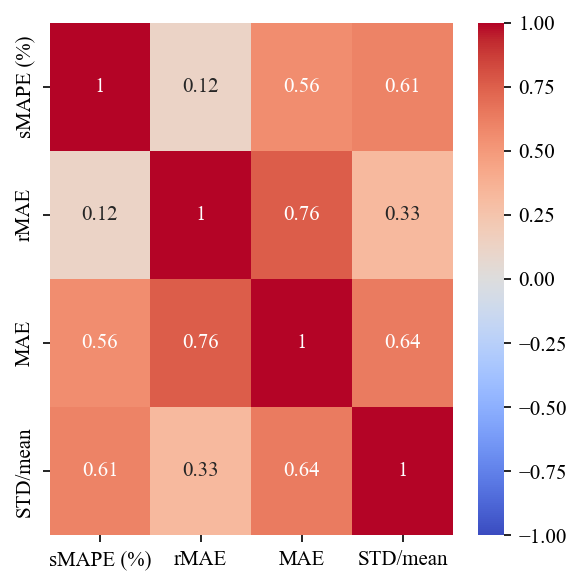

In [89]:
plt.figure(figsize=(4, 4), dpi=150)
sns.heatmap(pd.DataFrame(Table)[['sMAPE (%)', 'rMAE', 'MAE','STD/mean']].corr(), cmap='coolwarm', annot=True, vmin=-1, vmax=1)
plt.tight_layout()
plt.savefig('Figures/'+ 'Correlation'+ '.png', dpi=500)

#### Std Plots

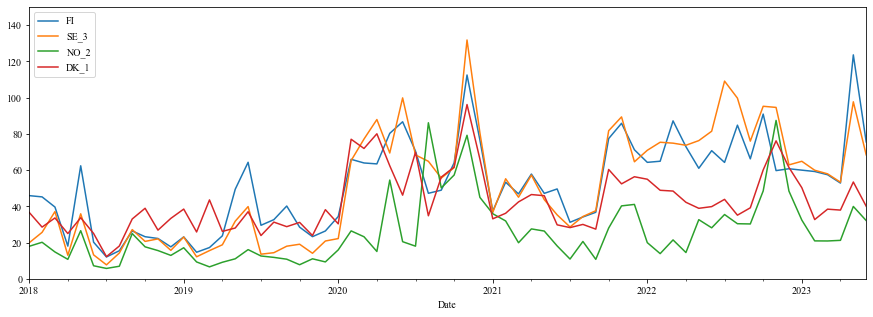

In [90]:
zones = ['FI', 'SE_3', 'NO_2', 'DK_1']
for zone in zones:
    X = 100 * Prices[zone]['Price'].resample('M').std() / Prices[zone]['Price'].resample('M').mean()
    X.plot(figsize=(15,5), label=zone)
    plt.legend()
    plt.ylim([0,150])

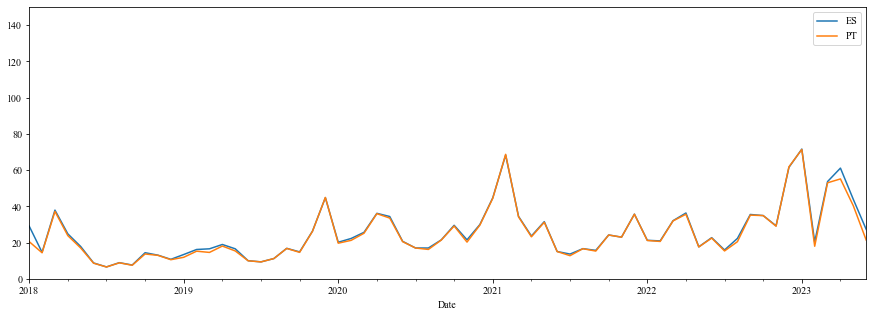

In [91]:
zones = ['ES', 'PT']
for zone in zones:
    X = 100 * Prices[zone]['Price'].resample('M').std() / Prices[zone]['Price'].resample('M').mean()
    X.plot(figsize=(15,5), label=zone)
    plt.legend()
    plt.ylim([0,150])

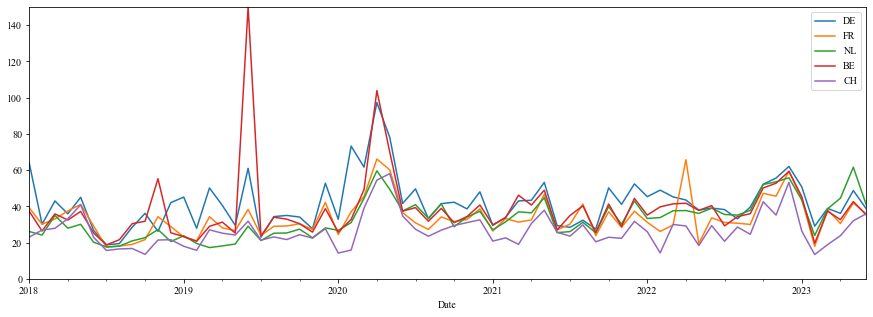

In [92]:
zones = ['DE', 'FR', 'NL', 'BE', 'CH']
for zone in zones:
    X = 100 * Prices[zone]['Price'].resample('M').std() / Prices[zone]['Price'].resample('M').mean()
    X.plot(figsize=(15,5), label=zone)
    plt.legend()
    plt.ylim([0,150])

In [93]:
zone = 'FI'
Prices[zone]['Price']

Date
2018-01-01 00:00:00    26.33
2018-01-01 01:00:00    26.43
2018-01-01 02:00:00    26.10
2018-01-01 03:00:00    24.70
2018-01-01 04:00:00    24.74
                       ...  
2023-06-30 19:00:00    68.26
2023-06-30 20:00:00    64.60
2023-06-30 21:00:00    60.18
2023-06-30 22:00:00    56.58
2023-06-30 23:00:00    39.95
Name: Price, Length: 48168, dtype: float64

In [94]:
zone = 'FI'
Prices[zone]['Preds']

Date
2018-01-01 00:00:00     24.286213
2018-01-01 01:00:00     23.738813
2018-01-01 02:00:00     23.208815
2018-01-01 03:00:00     22.965720
2018-01-01 04:00:00     22.730482
                          ...    
2023-06-30 19:00:00     94.904366
2023-06-30 20:00:00    104.619225
2023-06-30 21:00:00     92.811390
2023-06-30 22:00:00     88.876770
2023-06-30 23:00:00     77.778625
Name: Preds, Length: 48168, dtype: float64

<AxesSubplot: xlabel='Date'>

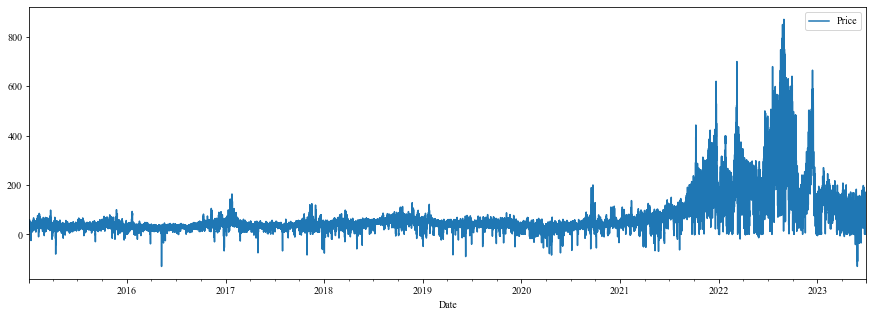

In [95]:
df_prices = read_price('DE')
df_prices.plot(figsize=(15,5))

<AxesSubplot: xlabel='Date'>

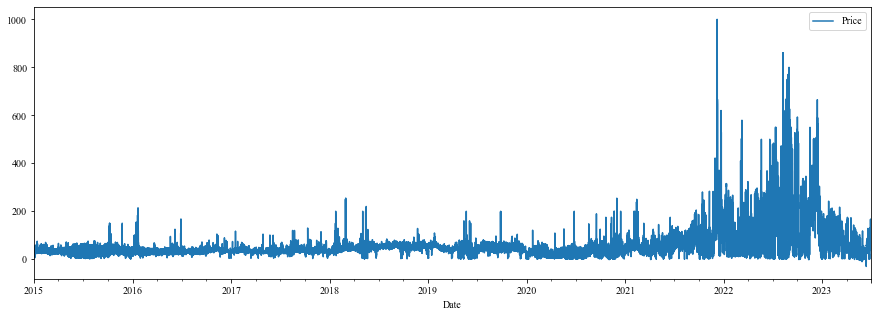

In [96]:
df_prices = read_price('FI')
df_prices.plot(figsize=(15,5))